In [42]:
# -*- coding: utf-8 -*-
"""
Created on 10/01, 2022
@author: Willy Fang
"""

'\nCreated on 10/01, 2022\n@author: Willy Fang\n'

# Import Libraries

In [1]:
import pandas as pd
import numpy as np
from glob import glob
import math
import os
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 1000)
import cv2
import pytesseract
from pdf2image import convert_from_path  # Faster way if using Anaconda: conda install -c conda-forge poppler
# import PyPDF2
# from PyPDF2 import PdfFileReader
# from PIL import Image
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore")
# pytesseract.pytesseract.tesseract_cmd = r'\Tesseract-OCR\tesseract.exe'
pytesseract.pytesseract.tesseract_cmd = r'D:\Tesseract-OCR\tesseract.exe'

# Convert PDFs to Images (JPGs)

In [18]:
for pdf_file in glob("*.pdf"):
    folder_name = pdf_file.split(".")[0]
    if not os.path.isdir(folder_name):
        os.mkdir(folder_name)

    print("Converting "+pdf_file+"......")
    pages = convert_from_path(pdf_file, dpi=400)
    print("Converting "+pdf_file+" Done!")
    
    print("Saving Images of "+pdf_file+"......")
    for ind, page in enumerate(pages):
        page.save(folder_name+'/Page_'+str(ind+1)+'.jpg', 'JPEG')
    print("Saving Images of "+pdf_file+" Done!")
    print()

Converting Certificate of Degree.pdf......
Converting Certificate of Degree.pdf Done!
Saving Images of Certificate of Degree.pdf......
Saving Images of Certificate of Degree.pdf Done!

Converting Certificate of Degree_Marked.pdf......
Converting Certificate of Degree_Marked.pdf Done!
Saving Images of Certificate of Degree_Marked.pdf......
Saving Images of Certificate of Degree_Marked.pdf Done!

Converting HackerRank Certificates.pdf......
Converting HackerRank Certificates.pdf Done!
Saving Images of HackerRank Certificates.pdf......
Saving Images of HackerRank Certificates.pdf Done!

Converting Transcripts.pdf......
Converting Transcripts.pdf Done!
Saving Images of Transcripts.pdf......
Saving Images of Transcripts.pdf Done!



# Text Recognition V01

In [3]:
# ### Pre-Processing
# # def get_cv2_img1(img_path):
# #     img = cv2.imread(img_path)
# #     gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # COLOR_BGR2GRAY、COLOR_BGR2HSV
# #     img_blur = cv2.GaussianBlur(gray, (3,3), 0)
# #     _,thresh = cv2.threshold(img_blur, 200, 255, cv2.THRESH_BINARY_INV)
# #     return [img, gray, img_blur, thresh]

# ### Pre-Processing
# def get_cv2_img1(img_path):
#     img = cv2.imdecode(np.fromfile(img_path,dtype=np.uint8),-1)[100:1700, 50:2550-50]
#     img_gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY) # COLOR_BGR2GRAY
#     return img_gray

# ### Text Data Processing
# def remove_space(x):
#     if x.strip() == "" or x.strip() == "nan":
#         return np.nan
#     else:
#         return x

# ### Read Text from Image
# def image_recognition1(img_path):
#     text = pytesseract.image_to_data(get_cv2_img1(img_path), lang='eng', output_type="data.frame")
#     text["text"] = text["text"].astype(str).apply(lambda x: remove_space(x))
#     text = text.dropna(how="any").reset_index(drop=True)
#     text["text"] = text["text"].apply(lambda x: x.replace(",","").replace(":",""))
#     return text

In [4]:
# for i in [1, 2, 3, 4]:
#     if not os.path.isdir('kickoff_'+str(i)+"_Edit/JPG/Converted"):
#         os.mkdir('kickoff_'+str(i)+"_Edit/JPG/Converted")
#     print("Image recognition "+str(i)+"......")
#     for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/*.jpg"):
#         image_recog_df = image_recognition1(image_path)
#         df_name = image_path.split(".")[0].split("\\")[-1]
#         image_recog_df.to_excel('kickoff_'+str(i)+"_Edit/JPG/Converted/"+df_name+".xlsx", index=False)
#     print("Image recognition "+str(i)+" Done!")

# Text Recognition V02

In [5]:
### Image Pre-Processing: Load & Transform Images
def get_cv2_img2(img_path, method_num=1):
#     img = cv2.imdecode(np.fromfile(img_path, dtype=np.uint8),-1)[100:1700, 50:2550-50]
    img = cv2.imread(img_path)
    if method_num == 0: # Method 0: Original Image
        return img
    
    img_gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    if method_num == 1: # Method 1: Gray Scaling
        return img_gray
    
    elif method_num == 2: # Method 2: Gray Scaling & Binary Thresholding
        ret, img_gray = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
        return img_gray
    
    elif method_num == 3: # Method 3: Gray Scaling & Inverse Binary Thresholding
        ret, img_gray = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY_INV)
        return img_gray
    
    elif method_num == 4: # Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=45, contrast=35)
        return img_gray
    
    elif method_num == 5: # Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=25, contrast=50)
        return img_gray

    elif method_num == 6: # Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=-35, contrast=60)
        return img_gray

    elif method_num == 7: # Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding
        img_gray = modify_contrast_and_brightness1(img_gray, brightness=-35, contrast=60)
        ret, img_gray = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
        return img_gray


### Image Pre-Processing: Modify Contrast and Brightness of Images (if necessary)
def modify_contrast_and_brightness1(img, brightness=25, contrast=25):
#     brightness = +25  # + Increase Brightness / - Reduce Brightness
#     contrast = +25  # + Increase Contrast / - Reduce Contrast
    B = brightness / 255.0
    c = contrast / 255.0 
    k = math.tan((45 + 44 * c) / 180 * math.pi)
    img = (img - 127.5 * (1 - B)) * k + 127.5 * (1 + B)
#     The values have to be in range 0~255. If values>255 then values=255, If values<0 then values=0
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img


def remove_space(x):
    if x.strip() == "":
        return np.nan
    else:
        return x


### Text Recognition: Read Text and Process Data
def text_recognition2(img_path, n=1):
    text = pytesseract.image_to_data(get_cv2_img2(img_path, method_num=n), lang="eng+chi_tra", output_type="data.frame")
    text["text"] = text["text"].astype(str).apply(lambda x: remove_space(x))
    text = text.dropna(how="any")
#     text["text"] = text["text"].apply(lambda x: x.replace(",","").replace(":","").strip("_").strip("—"))
    text = text[text["text"]!=""]
    text = text[text["conf"]!=-1]
    text = text[text["text"]!="|"].reset_index(drop=True)
    return text.drop_duplicates(keep='last')


# def text_recognition_data_transform1(text):
#     return text.drop_duplicates(keep='last')


def text_recognition_data_to_txt1(text):
    text_string = ""
    for i in set(text["block_num"]):
        for j in set(text["line_num"]):
            if len(text[(text["block_num"]==i) & (text["line_num"]==j)]) == 0:
                continue
            text_string += text[(text["block_num"]==i) & 
                                (text["line_num"]==j)]["text"].str.cat(sep=' ') + "\n\n"
    return text_string.strip()


# def text_recognition_choose_best1(text_list):
#     text_list = [text for text in text_list if len(text)!=0]
#     best_conf = -0.0001
#     best_text = pd.DataFrame()
#     for text in text_list:
#         text_conf = np.mean(text[(text["width"]>200) & (text["width"]<350)]["conf"])
#         if text_conf>best_conf:
#             best_conf = text_conf
#             best_text = text
#     if len(best_text)==0:
#         for text in text_list:
#             text_conf = np.mean(text[(text["width"]>150) & (text["width"]<350)]["conf"])
#             if text_conf>best_conf:
#                 best_conf = text_conf
#                 best_text = text
#     return best_text

In [31]:
# tmp_path = "Transcripts\Page_1.jpg"
# tmp_path = "Certificate of Degree_Marked\Page_1.jpg"
# tmp_path = "Name Card\Personal Name Card.jpg"
tmp_path = "HackerRank Certificates\Page_2.jpg"


In [20]:
t = []
for i in range(0,7+1,1):
    t.append(text_recognition2(tmp_path,i))

In [32]:
# Methods' Conf Compared
# Method 0: Original Image
# Method 1: Gray Scaling
# Method 2: Gray Scaling & Binary Thresholding
# Method 3: Gray Scaling & Inverse Binary Thresholding
# Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)
# Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)
# Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)
# Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding
for i, tt in enumerate(t):
    try:
#         print("Method "+str(i)+": ", np.round(np.mean(tt[(tt["width"]>200) & (tt["width"]<350)]["conf"]), 2))
#         print("Method "+str(i)+": ", np.round(np.mean(tt[(tt["width"]>100) & (tt["width"]<350)]["conf"]), 2))
        print("Method "+str(i)+": ", np.round(np.mean(tt["conf"]), 2))
    except:
        print("Method "+str(i)+": Not a good method for this image")

Method 0:  49.76
Method 1:  27.88
Method 2:  83.6
Method 3:  83.82
Method 4:  87.7
Method 5:  87.72
Method 6:  27.88
Method 7:  79.73


ey er

Se

oF,

i

ah a

Ce

HackerRank®

aan Gt

C —

all ae

5 ge

Fe

a

This is to certi

Willy Fang

has successfully cleared the assessment for the skill

Python (Basic)

Ly

yee

t Lees

vee rete

A ke

ae

Fr.

Pints

os

a

=

Si

24 Jul, 2021 Harishankaran K

CTO, HackerRank

3 = Cd ad : —, =" = elgg =

Ce ir

ee = = om


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,1,1,1,1,7377,77,167,23,33.958130,ey
1,5,1,1,1,1,2,7561,77,44,27,34.477303,er
2,5,1,1,1,2,1,7355,94,223,37,7.744522,Se
3,5,1,1,1,3,1,7538,138,28,17,40.748398,"oF,"
4,5,1,2,1,1,1,2279,279,11,31,25.764633,i
5,5,1,2,1,2,1,2323,296,27,30,29.776474,ah
6,5,1,2,1,2,2,2411,300,22,16,48.792290,a
7,5,1,2,1,3,1,2283,305,50,28,20.378998,Ce
8,5,1,3,1,1,1,3422,1111,2039,222,0.000000,HackerRank®
9,5,1,3,1,2,1,3238,1705,609,307,21.092804,aan


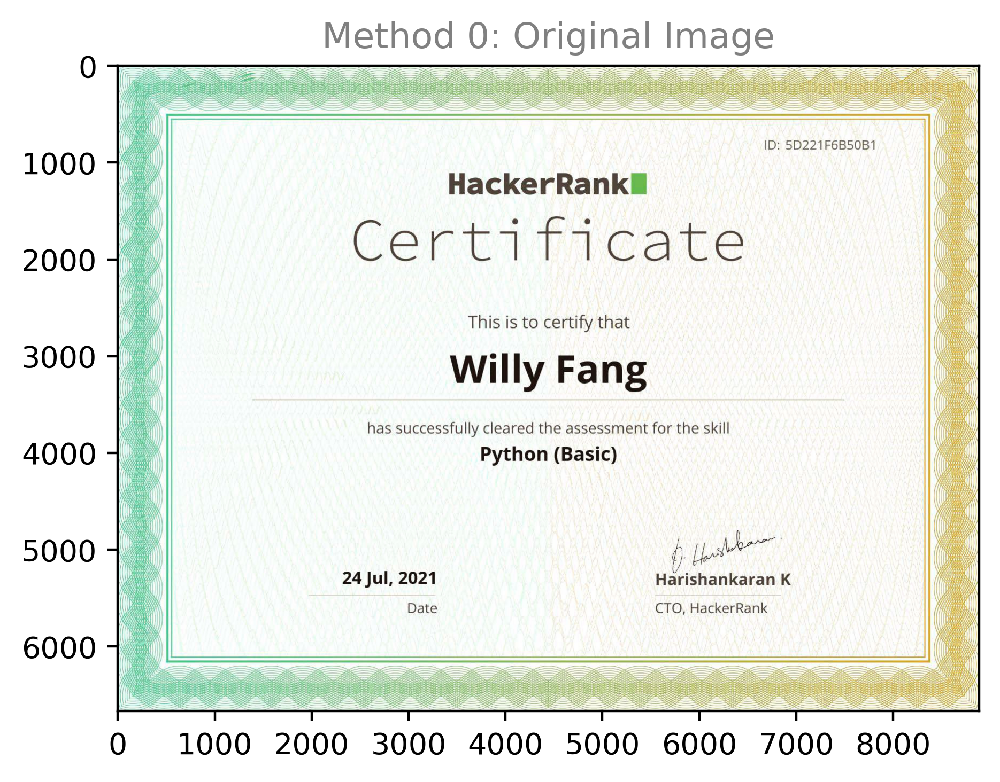

In [33]:
# Method 0: Original Image
plt.figure(dpi=400)
plt.title('Method 0: Original Image', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,0), cmap="gray")
print(text_recognition_data_to_txt1(t[0]))
t[0]

KA IN

ne Date CTO: HackerRal 1k Hy

et ae at I i Hh

et att

EP FP

ae i ay

; nee i : al

TULSA 4 4 aan

ee Fre

Ae We tie

ee de aD

eats Veh i} 0 1

Oe tats HI

PSE AA

全 ta

4 過 it HY vie on.

PAA ly

oe eee Ca _— — as : 7 : é i os = = ee : 點 點 ———— — —— 。 《 生 加 生 下 二 還)

) i Wie 當 2 2 SA

WW et hs ay he ee aoe a the i ———— ee ease : rane 二 Se te ee SEE a

eee dhe bed dee a eee Sg Ee eg ee ee het er et ig a a a 耳 本 eee a, Ee Seta Se ae 生 中 和 和

eed ad eee aa a ae ea, ea frets Pe ek ee a a ae gl — ss a ee a Pirie nai Se a 一 fet rs ee 全

WE AA

arnt ih Fy gee ae ea ig oo = eo te a tal = =, — Se i ea el ea coat Fa ar it eT = a Pe ge ear a a a F or eae a he eat Peo mm = he ea mL a i ee re qe ae a i el : era ee a Pe teen a a eae. ee a ay el nam a eri fe i! te

Wht ee i a ge gE Sha i a eg ee ae a a a a a i a ie a a a ag ge Sern aay i i

DB i gn a ae ae a ee ee oh a ee Ee a a a =a = 二 rar Pa 國 HI Fe ae “fe es atte. See i a, ; cig?! vi

有 由 nenuyrecee cage tenn tere coats fae raa tre eaua

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,22,1,1,1,1305,5,78,22,21.200417,ee
1,5,1,22,1,1,2,1528,16,19,5,22.566963,—_
2,5,1,22,1,1,3,6934,17,3,1,27.217552,""""
3,5,1,22,1,1,4,7062,0,48,18,12.428574,=a
4,5,1,22,1,1,5,7141,0,47,18,51.794933,Ul
...,...,...,...,...,...,...,...,...,...,...,...,...
1213,5,1,129,1,34,24,7132,6633,53,26,79.523621,—
1214,5,1,129,1,34,25,7311,6622,111,42,46.285419,—_
1215,5,1,129,1,34,26,7422,6622,141,39,26.223755,"<="""
1216,5,1,129,1,34,27,7650,6634,104,28,4.646622,ee


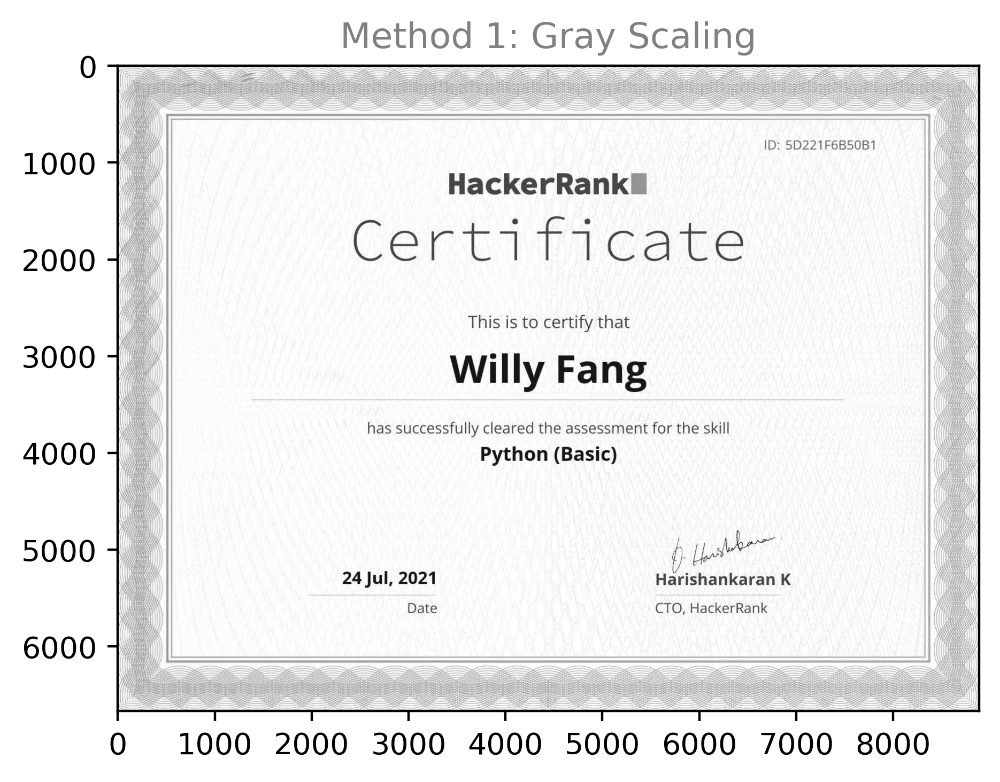

In [34]:
# Method 1: Gray Scaling
plt.figure(dpi=400)
plt.title('Method 1: Gray Scaling', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,1), cmap="gray")
print(text_recognition_data_to_txt1(t[1]))
t[1]

ID: S5D221rOB50B1

HackerRank

Certificate

This is to certify that

Willy Fang

nas successfully cleared the assessment for the skill

Python (Basic)

1) Las Li, 24 Jul, 2021 Harishankaran K

Date CTO, HackerRank


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,1,1,1,1,6683,772,139,94,90.096222,ID:
1,5,1,1,1,1,2,6900,772,905,94,21.816925,S5D221rOB50B1
2,5,1,2,1,1,1,3422,1111,1851,222,89.526932,HackerRank
3,5,1,2,1,2,1,2438,1555,4017,461,95.639954,Certificate
4,5,1,3,1,1,1,3616,2577,328,134,96.770615,This
5,5,1,3,1,1,2,4011,2583,105,128,96.935562,is
6,5,1,3,1,1,3,4177,2594,156,117,95.951012,to
7,5,1,3,1,1,4,4400,2577,500,178,96.460899,certify
8,5,1,3,1,1,5,4955,2577,328,134,52.386398,that
9,5,1,3,1,2,1,3427,2972,978,400,95.083115,Willy


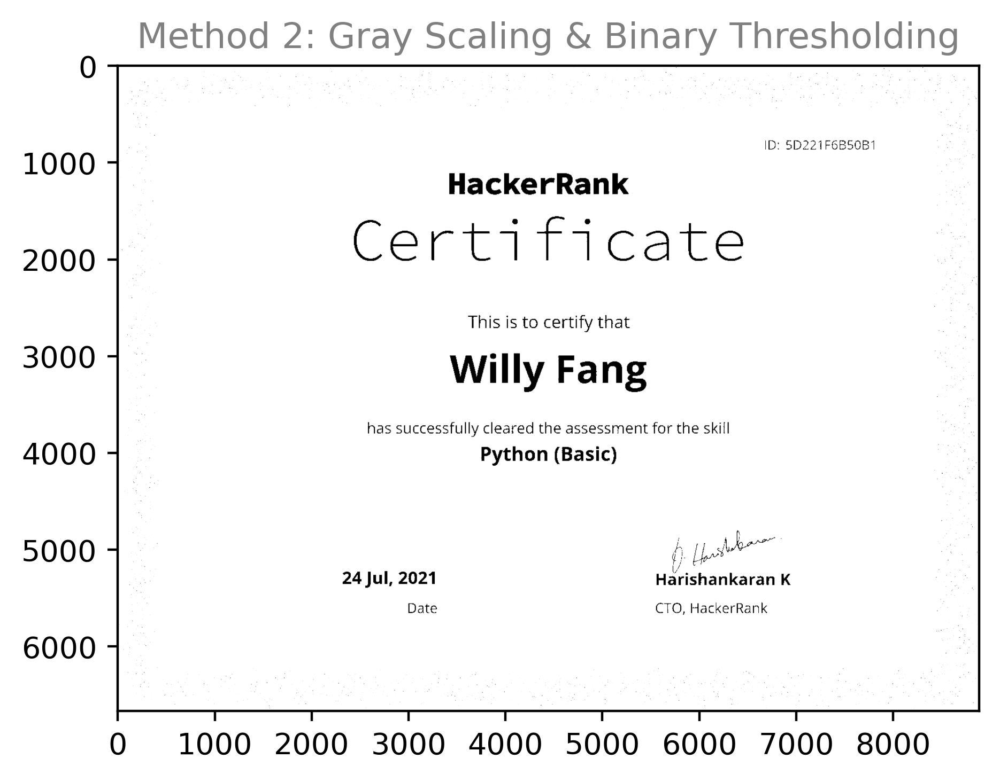

In [35]:
# Method 2: Gray Scaling & Binary Thresholding
plt.figure(dpi=400)
plt.title('Method 2: Gray Scaling & Binary Thresholding', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,2), cmap="gray")
print(text_recognition_data_to_txt1(t[2]))
t[2]

ID: S5D221r 065061

HackerRank

Certificate

This is to certify that

Willy Fang

nas successfully cleared the assessment for the skill

Python (Basic)

1) Las Le, 24 Jul, 2021 Harishankaran K

Date CTO, HackerRank


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,1,1,1,1,6683,772,139,94,89.748528,ID:
1,5,1,1,1,1,2,6924,768,425,134,49.096100,S5D221r
2,5,1,1,1,1,3,7382,772,423,94,38.091362,065061
3,5,1,2,1,1,1,3422,1111,1851,222,88.575905,HackerRank
4,5,1,2,1,2,1,2438,1555,4017,461,95.430595,Certificate
5,5,1,3,1,1,1,3616,2577,328,134,96.650322,This
6,5,1,3,1,1,2,4011,2583,105,128,96.926323,is
7,5,1,3,1,1,3,4177,2594,156,117,96.057289,to
8,5,1,3,1,1,4,4400,2577,500,178,96.724274,certify
9,5,1,3,1,1,5,4955,2577,328,134,69.351616,that


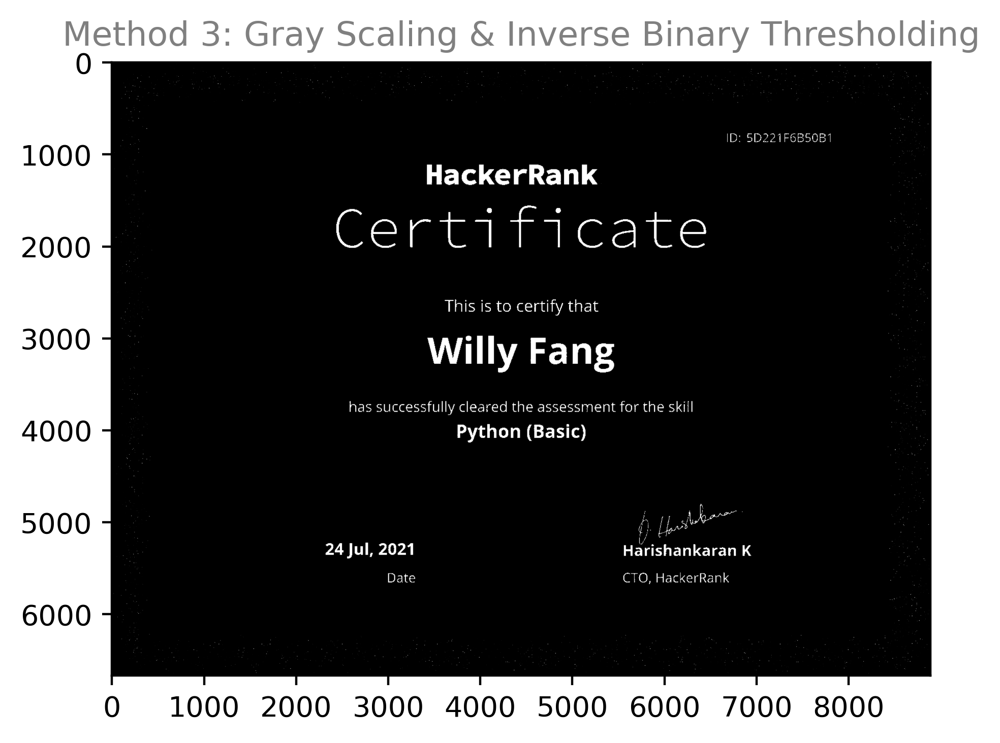

In [36]:
# Method 3: Gray Scaling & Inverse Binary Thresholding
plt.figure(dpi=400)
plt.title('Method 3: Gray Scaling & Inverse Binary Thresholding', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,3), cmap="gray")
print(text_recognition_data_to_txt1(t[3]))
t[3]

ID: 5D221F6B50B1

HackerRank

Certificate

This is to certify that

Willy Fang

has successfully cleared the assessment for the skill

Python (Basic)

全 上 Date CTO, HackerRank

U

24 Jul, 2021 Harishankaran K


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,1,1,1,1,6683,772,139,94,85.808708,ID:
1,5,1,1,1,1,2,6900,772,905,94,18.162010,5D221F6B50B1
2,5,1,2,1,1,1,3422,1111,1850,222,90.656174,HackerRank
3,5,1,2,1,2,1,2438,1555,4017,461,94.975555,Certificate
4,5,1,3,1,1,1,3616,2577,328,134,96.608604,This
5,5,1,3,1,1,2,4011,2583,105,128,96.927383,is
6,5,1,3,1,1,3,4177,2594,156,117,96.337181,to
7,5,1,3,1,1,4,4400,2577,500,178,96.586288,certify
8,5,1,3,1,1,5,4955,2577,328,134,93.483368,that
9,5,1,3,1,2,1,3427,2972,978,400,96.073410,Willy


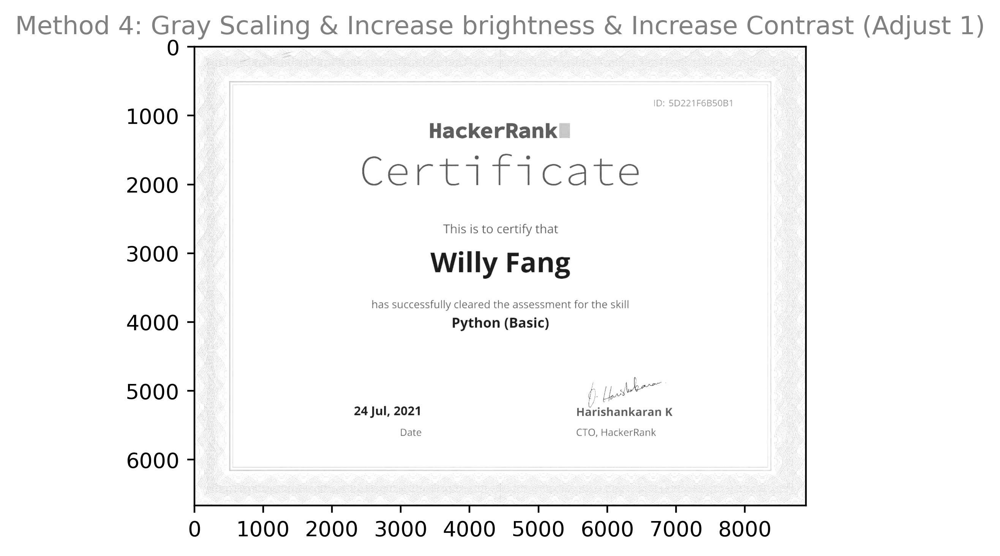

In [37]:
# Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)
plt.figure(dpi=400)
plt.title('Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,4), cmap="gray")
print(text_recognition_data_to_txt1(t[4]))
t[4]

ID: 5D221F6B50B1

HackerRank

Certificate

This is to certify that

Willy Fang

has successfully cleared the assessment for the skill

Python (Basic)

人

U

24 Jul, 2021 Harishankaran K

Date CTO, HackerRank


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,1,1,1,1,6683,772,139,94,78.812874,ID:
1,5,1,1,1,1,2,6900,772,905,94,29.390755,5D221F6B50B1
2,5,1,2,1,1,1,3422,1111,1894,222,88.798767,HackerRank
3,5,1,2,1,2,1,2438,1555,4017,461,95.155602,Certificate
4,5,1,3,1,1,1,3616,2577,328,134,96.321342,This
5,5,1,3,1,1,2,4011,2583,105,128,96.929222,is
6,5,1,3,1,1,3,4177,2594,156,117,95.343864,to
7,5,1,3,1,1,4,4400,2577,500,178,95.343864,certify
8,5,1,3,1,1,5,4955,2577,328,134,92.026306,that
9,5,1,3,1,2,1,3427,2972,978,400,96.612122,Willy


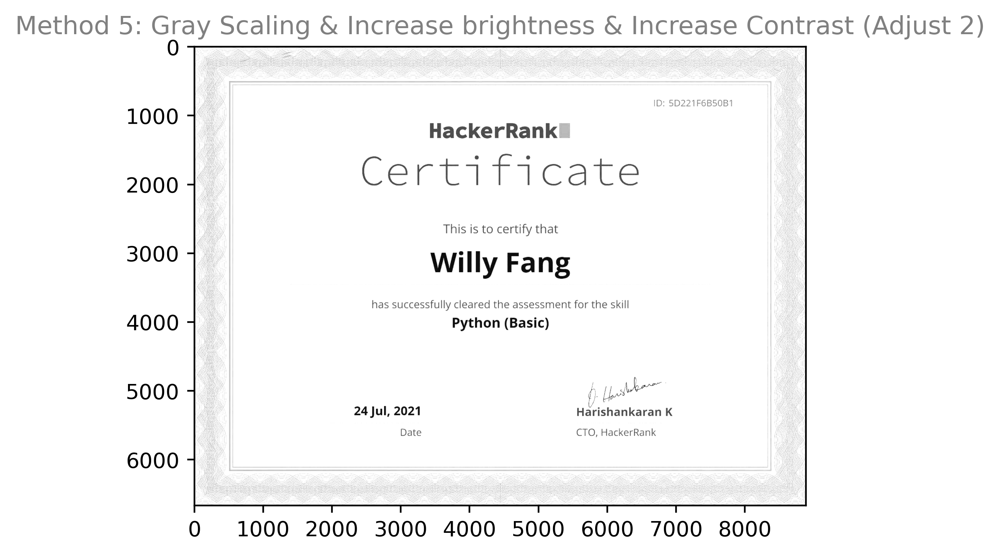

In [43]:
# Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)
plt.figure(dpi=400)
plt.title('Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,5), cmap="gray")
print(text_recognition_data_to_txt1(t[5]))
t[5]

Sg —_ 一 一 一 一 一 一 一 二 人 一 一 — .

ee a Pa Sh —— hak mee a, rat a aro : 4

: = 和 er as 站 a na ee ° Fa =a rete oe : ae ge 和 er Pie Te < 8 See ; . : a gt '

‘ _ an i : z z a age a = Cg = “in 【 _ em, mu oA Pr r et = oli 2 a a fa “ae ai - 5 gag : 7 :

: ‘ le FS a ea eS 一 一 一 na Se eS ag - ee ee 還 ee Ho ee a ge ee eS lg Ea a el ee on i ee fy ae . a a ee er

= “e . = ie . he = ats a = : ale - >

和 品 Se a = aot Ee a = <a ne a, > eh ee el a age Se es = ee * gg gg ae Sn ag eg a Pg ee ph, : a tp Be ol ee

oe a a poe RD ae a Se a a A a a ar ae i a ee i oti, te te 2 各 a ne oe ae ge Sa a a ee ee ae tae a ee a a ag a fe ae era

a ss ‘ zion am aes a +2 : Sa ge ag a a rg a a ea a PP aS Tn a a al da i te aed cee a gn oe

=r. i ot =. se pe tS Pe PET ar = : Pg eg i A i a i a

sid et or eee 品 me — Se ec = ba aa ex hin eter ros oe esi vont ee he Se = : a ee gee eats lie en o lees ee eae ag See a See ee ee ace bated Beta a + * - Pa cee tar —— 二

ee eae a a siden ian tttetes teen antares ee re : ree ate

ge a 

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,4,1,1,1,1133,0,133,38,23.902847,Sg
1,5,1,4,1,1,2,3249,0,208,53,22.352478,—_
2,5,1,4,1,1,3,4477,27,78,17,42.384575,一
3,5,1,4,1,1,4,4581,0,61,54,77.675400,一
4,5,1,4,1,1,5,4641,5,36,28,92.518036,一
...,...,...,...,...,...,...,...,...,...,...,...,...
1408,5,1,144,1,18,25,7650,6639,27,11,73.486069,=
1409,5,1,144,1,18,26,7871,6628,56,22,43.932297,—
1410,5,1,144,1,18,27,7978,6645,21,10,0.000000,a
1411,5,1,144,1,18,28,8141,6657,3,2,28.566162,.


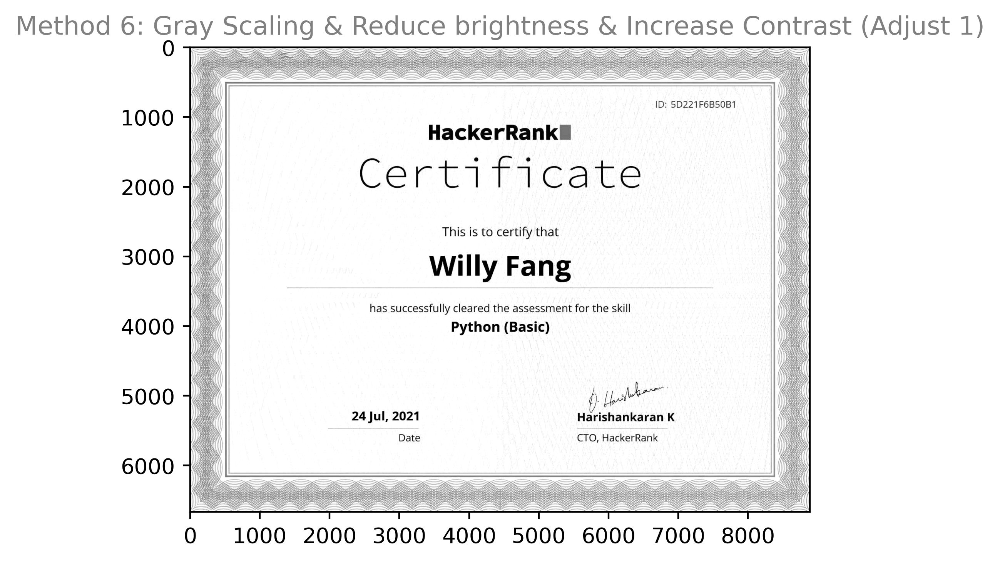

In [39]:
# Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)
plt.figure(dpi=400)
plt.title('Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,6), cmap="gray")
print(text_recognition_data_to_txt1(t[6]))
t[6]

=P

wae

ery

eet e

This is to certify that

Willy Fang

has successfully cleared the assessment for the skill

Python (Basic)

} [Ln%

24 Jul, 2021 Harishankaran K

Date CTO, HackerRank


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,5,1,43,1,1,1,3616,2577,328,134,96.644592,This
1,5,1,43,1,1,2,4011,2583,111,128,95.307701,is
2,5,1,43,1,1,3,4177,2594,156,117,95.598236,to
3,5,1,43,1,1,4,4400,2572,505,183,95.598236,certify
4,5,1,43,1,1,5,4955,2577,328,134,96.506516,that
5,5,1,44,1,1,1,3427,2972,983,400,95.234962,Willy
6,5,1,44,1,1,2,4544,2994,911,378,96.193481,Fang
7,5,1,50,1,1,1,2583,3683,239,117,96.948761,has
8,5,1,50,1,1,2,2877,3683,850,156,95.673210,successfully
9,5,1,50,1,1,3,3777,3682,511,123,96.091194,cleared


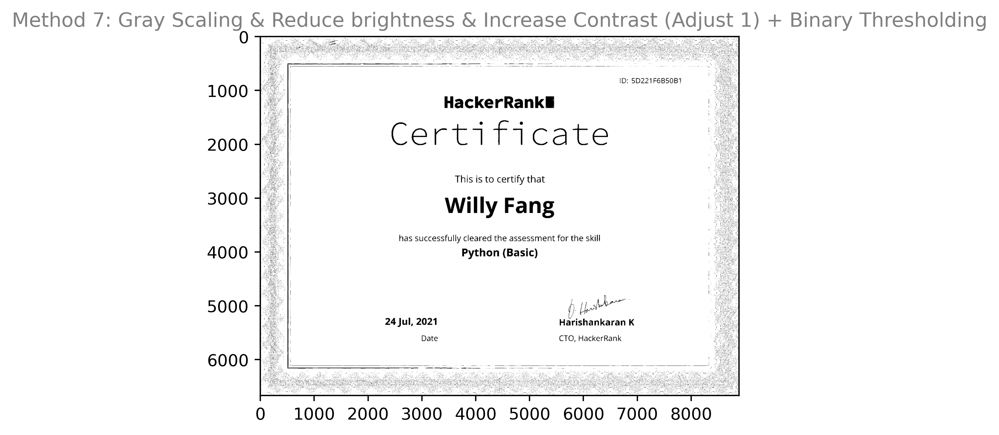

In [40]:
# Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding
plt.figure(dpi=400)
plt.title('Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding', color= 'gray')
plt.imshow(get_cv2_img2(tmp_path,7), cmap="gray")
print(text_recognition_data_to_txt1(t[7]))
t[7]

In [ ]:
# plt.figure(dpi=400)
# plt.title('Method 0: Original Image', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,0), cmap="gray")
# plt.figure(dpi=400)
# plt.title('Method 1: Gray Scaling', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,1), cmap="gray")
# plt.figure(dpi=400)
# plt.title('Method 2: Gray Scaling & Binary Thresholding', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,2), cmap="gray")
# plt.figure(dpi=400)
# plt.title('Method 3: Gray Scaling & Inverse Binary Thresholding', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,3), cmap="gray")
# plt.figure(dpi=400)
# plt.title('Method 4: Gray Scaling & Increase brightness & Increase Contrast (Adjust 1)', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,4), cmap="gray")
# plt.figure(dpi=400)
# plt.title('Method 5: Gray Scaling & Increase brightness & Increase Contrast (Adjust 2)', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,5), cmap="gray")
# plt.figure(dpi=400)
# plt.title('Method 6: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1)', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,6), cmap="gray")
# plt.figure(dpi=400)
# plt.title('Method 7: Gray Scaling & Reduce brightness & Increase Contrast (Adjust 1) + Binary Thresholding', color= 'gray')
# plt.imshow(get_cv2_img2(tmp_path,7), cmap="gray")

In [41]:
# # for i in [5]:
# for i in range(1, 15+1):
#     if not os.path.isdir('kickoff_'+str(i)+"_Edit/JPG/Converted2_3"):
#         os.mkdir('kickoff_'+str(i)+"_Edit/JPG/Converted2_3")
#     print("Image recognition "+str(i)+"......")
    
#     with pd.ExcelWriter('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/Kickoff_"+str(i)+".xlsx") as writer:
        
#         for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/Unmarked/*.jpg"):
#             image_recog_df_list = [text_recognition_data_transform1(text_recognition2(image_path, 0)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 1)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 6)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 7))]
#             image_recog_df = image_recognition_choose_best1(image_recog_df_list)
#             with open('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/"+image_path.split("\\")[-1].split(".")[0]+".txt", "w", encoding='UTF-8') as text_file:
#                 text_file.write(image_recognition_data_transform_text1(image_recog_df))
#             image_recog_df.to_excel(writer, sheet_name=image_path.split("\\")[-1].split(".")[0], index=False)
        
#         for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/New/*.jpg"):
#             image_recog_df_list = [text_recognition_data_transform1(text_recognition2(image_path, 0)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 1)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 2)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 3)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 4)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 5)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 6)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 7))]
#             image_recog_df = image_recognition_choose_best1(image_recog_df_list)
#             with open('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/"+image_path.split("\\")[-1].split(".")[0]+".txt", "w", encoding='UTF-8') as text_file:
#                 text_file.write(image_recognition_data_transform_text1(image_recog_df))
#             image_recog_df.to_excel(writer, sheet_name=image_path.split("\\")[-1].split(".")[0], index=False)
        
#         for image_path in glob('kickoff_'+str(i)+"_Edit/JPG/Marked/*.jpg"):
#             image_recog_df_list = [text_recognition_data_transform1(text_recognition2(image_path, 2)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 3)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 4)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 5)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 6)), 
#                                    text_recognition_data_transform1(text_recognition2(image_path, 7))]
#             image_recog_df = image_recognition_choose_best1(image_recog_df_list)
#             with open('kickoff_'+str(i)+"_Edit/JPG/Converted2_3/"+image_path.split("\\")[-1].split(".")[0]+".txt", "w", encoding='UTF-8') as text_file:
#                 text_file.write(image_recognition_data_transform_text1(image_recog_df))
#             image_recog_df.to_excel(writer, sheet_name=image_path.split("\\")[-1].split(".")[0], index=False)
        
        
#     print("Image recognition "+str(i)+" Done!")

In [ ]:
# temp_string = ""
# for i in set(t[7]["block_num"]):
#     for j in set(t[7]["line_num"]):
#         temp_string += t[7][(t[7]["block_num"]==i) & (t[7]["line_num"]==j)]["text"].str.cat(sep=' ') + "\n"
# print(temp_string)

In [122]:
# 1.	level = 1/2/3/4/5，用於標注當前項的層級。
# 2.	page_num, level = 1;用於標注當前項所屬頁面。一般情況下，單張圖片的內容均會被分在同一個頁，且在tsv檔中只有第一行的level為1，當level=1時，left=0, top=0, width和height分別是圖片的實際寬度和高度。
# 3.	block_num, level = 2; Tesseract會將圖像分割為多個不同的block，block會出現1，2，3……等等值
# 4.	par_num, level = 3; 從Tessract的相關文檔來看，該參數應該是當前圖像中文字的段落分類，level=1/2/3時，該值為0；其他情況為1。
# 5.	line_num, level = 4; 一般均為1。
# 6.	word_num, level = 5;在同一行[line_num]中出現的單詞序號。
# 7.	left/top/width/height：當前項所在長方形區域的左上角，寬度，高度。
# 8.	conf，當前檢測字元的置信度，表示項無文字，值為-1；若Tesseract認為當前區域有文字，則其值得範圍為0~100。

# References

1. https://stackoverflow.com/questions/71442585/adjusting-pytesseract-parameters
2. https://ithelp.ithome.com.tw/articles/10210214
3. https://python-bloggers.com/2022/05/extract-text-from-image-using-python/
4. (tabula) https://aegis4048.github.io/parse-pdf-files-while-retaining-structure-with-tabula-py
5. https://stackoverflow.com/questions/34837707/how-to-extract-text-from-a-pdf-file
6. https://www.geeksforgeeks.org/extract-text-from-pdf-file-using-python/
7. https://towardsdatascience.com/how-to-extract-text-from-pdf-245482a96de7
8. https://towardsdatascience.com/extracting-text-from-scanned-pdf-using-pytesseract-open-cv-cd670ee38052
9. https://betterprogramming.pub/efficiently-convert-pdf-to-png-or-jpeg-images-in-python-50c5ce224c20
10. https://pdf.wondershare.com/pdf-knowledge/pdf-to-png-python.html
11. https://github.com/tesseract-ocr/tesseract
12. https://vimsky.com/zh-tw/examples/usage/python-opencv-cv2-cvtcolor-method.html
13. https://pdf2image.readthedocs.io/en/latest/reference.html
14. (Need Java) https://products.aspose.com/cells/python-java/conversion/jpg-to-excel/
15. https://ithelp.ithome.com.tw/articles/10245342
16. https://blog.csdn.net/hxxjxw/article/details/117961339
17. https://dotblogs.com.tw/CYLcode/2020/03/12/111420
18. https://ithelp.ithome.com.tw/users/20120424/ironman/3642
19. https://blog.gtwang.org/programming/opencv-drawing-functions-tutorial/
20. https://splunktool.com/pandas-dataframe-select-multiple-discontinuous-columnsslices
21. https://ithelp.ithome.com.tw/articles/10240032
22. https://ithelp.ithome.com.tw/articles/10246927
23. https://steam.oxxostudio.tw/category/python/basic/try-except.html
24. https://openhome.cc/zh-tw/python/exception/try-except/
25. https://pypi.org/project/pytesseract/
26. https://lufor129.medium.com/opencv圖片處理整理-緩慢更新-b45e248d14bb
27. https://medium.com/jimmy-wang/opencv-基礎教學筆記-with-python-d780f571a57a
28. https://livezingy.com/pytesseract-image_to_data_locate_text/
29. https://pypi.org/project/pytesseract/
30. https://weirenxue.github.io/2021/06/12/python_cp950_codec_cant_encode/
31. https://stackoverflow.com/questions/5214578/print-string-to-text-file
32. https://stackoverflow.com/questions/33279940/how-to-combine-multiple-rows-of-strings-into-one-using-pandas
33. https://d246810g2000.medium.com/文字辨識方法統整-1e3d3ba5fe54
34. 
35. 

# XXX